<a href="https://colab.research.google.com/github/antomys/SemanticSegmentation/blob/master/Semantic_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.layers import AveragePooling2D, GlobalAveragePooling2D, UpSampling2D, Reshape, Dense, Dropout, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet_v2 import ResNet101V2
from tensorflow.keras.utils import to_categorical   
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
print(f"GPU AVAILABLE: {tf.config.list_physical_devices('GPU')}")

import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

from os import listdir
from os.path import isfile, join

from sklearn.model_selection import train_test_split
from skimage import io
import random
from skimage import transform
from tqdm import tqdm

import numpy as np

from matplotlib import pyplot as plt
import cv2

GPU AVAILABLE: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Preprocess

In [4]:
try:
    os.mkdir('./label_images_semantic')
except Exception as e:
    print(e)
try:
    os.mkdir('./original_images')
except Exception as e:
    print(e)

for image_filename in tqdm(os.listdir('../content/drive/MyDrive/segmentation/dataset/semantic_drone_dataset/label_images_semantic')):
    image = cv2.imread('../content/drive/MyDrive/segmentation/dataset/semantic_drone_dataset/label_images_semantic/'+image_filename, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (512,512))
    cv2.imwrite('./label_images_semantic/'+image_filename, image)
    
for image_filename in tqdm(os.listdir('../content/drive/MyDrive/segmentation/dataset/semantic_drone_dataset/original_images')):
    image = cv2.imread('../content/drive/MyDrive/segmentation/dataset/semantic_drone_dataset/original_images/'+image_filename)
    image = cv2.resize(image, (512,512))
    cv2.imwrite('./original_images/'+image_filename, image)

[Errno 17] File exists: './label_images_semantic'
[Errno 17] File exists: './original_images'


100%|██████████| 400/400 [03:28<00:00,  1.92it/s]


In [5]:
class CustomDataGen(tf.keras.utils.Sequence):
    
    def __init__(self, path,
                 batch_size = 2,
                 shuffle=True, seed = 1, subset = 'training',
                 data_augmentation = False,
                 one_hot = True):
        self.path = path
        self.n_classes = 24
        self.one_hot = one_hot
        self.batch_size = batch_size
        self.data_augmentation = data_augmentation
        
        self.imageGenerator = ImageDataGenerator(
            horizontal_flip = True,
            vertical_flip = True,
            #fill_mode = 'reflect',
            #zoom_range = (0.7, 1.5),
            #width_shift_range = 0.2,
            #height_shift_range = 0.2,
            #rotation_range = 365
        )
        
        self.X_paths = [join(f"{path}/original_images/", f) for f in sorted(listdir(f"{path}/original_images/")) if isfile(join(f"{path}/original_images", f))]
        self.y_paths = [join(f"{path}/label_images_semantic/", f) for f in sorted(listdir(f"{path}/label_images_semantic/")) if isfile(join(f"{path}/label_images_semantic/", f))]
        
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X_paths, self.y_paths, test_size=0.2, random_state = seed)
        self.X_train, self.X_val, self.y_train, self.y_val = train_test_split(self.X_train, self.y_train, test_size=0.2, random_state = seed)
        
        if subset == 'training':
            self.X, self.y = self.X_train, self.y_train
                
        elif subset == 'validation':
            self.X, self.y = self.X_val, self.y_val
        else:
            self.X, self.y = self.X_test, self.y_test
            
        self.n = len(self.X)
    
    def on_epoch_end(self):
        pass
    
    def __getitem__(self, index):
        data_x, data_y = [], []
        
        for i in range(self.batch_size):
            x = io.imread(self.X[self.batch_size * index + i]) / 255            
            y = io.imread(self.y[self.batch_size * index + i], cv2.IMREAD_GRAYSCALE)
            
            if self.data_augmentation:
                seed = random.randint(0, 2**32)
                y = np.expand_dims(y, axis = 2)
                x, y = self.imageGenerator.random_transform(x, seed), self.imageGenerator.random_transform(y, seed) 
           
            data_x.append(x)
            
            if self.one_hot:
                y = to_categorical(y, self.n_classes)
            data_y.append(y)
            
        return np.array(data_x), np.array(data_y)
    
    def __len__(self):
            
        return self.n // self.batch_size

### Color per class and name of each class

We create the 3 datasets (train, validation and testing)

In [7]:
rgb_representations = np.array([(0,0,0), (128,64,128),(130,76,0),(0,102,0), (112,103,87),(28,42,168),(48,41,30), (0,50,89), (107,142,35),(70,70,70), (102,102,156),(254,228,12),
                      (254,148,12), (190,153,153),(153,153,153), (255,22,96), (102,51,0), (9,143,150), (119,11,32), (51,51,0), (190,250,190), (112,150,146), 
                       (2,135,115), (255,0,0)], np.uint8)
classes = ['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 
           'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']

def print_legend():
    rows = 4
    cols = 6
    fig, axs = plt.subplots(rows,cols, figsize = (6,6))
    fig.tight_layout()
    for i in range(rows):
        for j in range(cols):
            color = np.zeros((1,1,3), np.uint8)
            color[:,:] = rgb_representations[i*cols + j]
            axs[i][j].set_title(classes[i*cols + j])
            axs[i][j].imshow(color)
            
            #Eliminar las etiquetas de los ejes
            axs[i][j].set_xticks([])
            axs[i][j].set_yticks([])
    
    plt.show()
len(classes)

24

In [8]:
train_datagen = CustomDataGen("./", data_augmentation = True)
val_datagen = CustomDataGen("./", subset = "validation")
test_datagen = CustomDataGen("./", subset = "test")

Gt shape: (512, 512, 24)


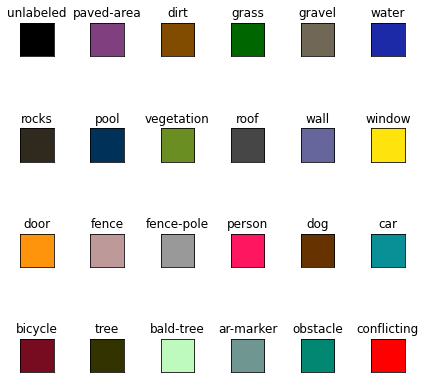

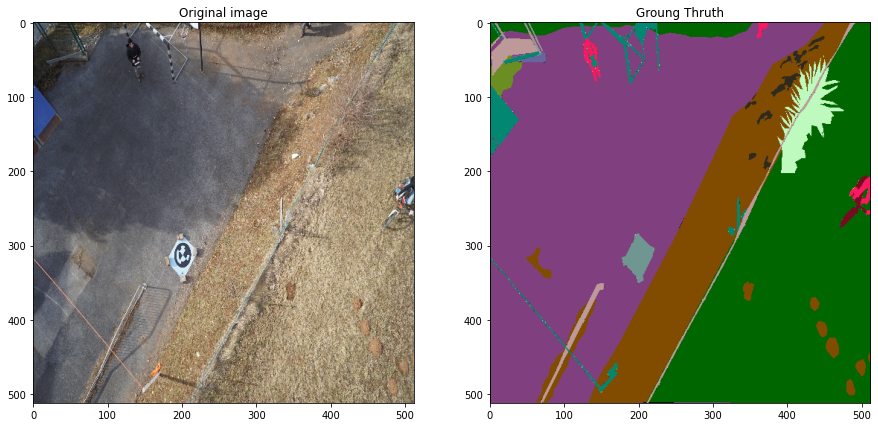

In [15]:
X, y = train_datagen[25]
print(f'Gt shape: {y[0].shape}')

print_legend()
fig, axs = plt.subplots(1, 2, figsize=(15,7))
axs[0].set_title('Original image')
axs[0].imshow(X[1])
axs[1].set_title('Groung Thruth')
axs[1].imshow(rgb_representations[y.argmax(axis = 3)][1])
plt.show()

### Dice Loss and DeepLabv3+ with Resnet50 backbone

In [47]:
@tf.function
def dice_loss(y_true, y_pred):
    numerator = tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true * y_true) + tf.reduce_sum(y_pred * y_pred) - tf.reduce_sum(y_true * y_pred)

    return 1 - numerator / denominator

class MyMeanIOU(tf.keras.metrics.MeanIoU):
    def update_state(self, y_true, y_pred, sample_weight=None):
        return super().update_state(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1), sample_weight)


def deeplab_plus(input_size = (512,512, 3), n_classes = 24,threshold = 0.5):
    def SqueezeAndExcite(inputs, ratio=8):
        init = inputs
        filters = init.shape[-1]
        se_shape = (1, 1, filters)

        se = GlobalAveragePooling2D()(init)
        se = Reshape(se_shape)(se)
        se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
        se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
        x = init * se
        return x

    def ASPP(inputs):
        """ Image Pooling """
        shape = inputs.shape
        y1 = AveragePooling2D(pool_size=(shape[1], shape[2]))(inputs)
        y1 = Conv2D(256, 1, padding="same", use_bias=False)(y1)
        y1 = BatchNormalization()(y1)
        y1 = Activation("relu")(y1)
        y1 = UpSampling2D((shape[1], shape[2]), interpolation="bilinear")(y1)

        """ 1x1 conv """
        y2 = Conv2D(256, 1, padding="same", use_bias=False)(inputs)
        y2 = BatchNormalization()(y2)
        y2 = Activation("relu")(y2)

        """ 3x3 conv rate=6 """
        y3 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=6)(inputs)
        y3 = BatchNormalization()(y3)
        y3 = Activation("relu")(y3)

        """ 3x3 conv rate=12 """
        y4 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=12)(inputs)
        y4 = BatchNormalization()(y4)
        y4 = Activation("relu")(y4)

        """ 3x3 conv rate=18 """
        y5 = Conv2D(256, 3, padding="same", use_bias=False, dilation_rate=18)(inputs)
        y5 = BatchNormalization()(y5)
        y5 = Activation("relu")(y5)

        y = Concatenate()([y1, y2, y3, y4, y5])
        y = Conv2D(256, 1, padding="same", use_bias=False)(y)
        y = BatchNormalization()(y)
        y = Activation("relu")(y)

        return y
        
    
    """ Input """
    inputs = Input(input_size)

    """ Encoder """
    encoder = ResNet50(weights="imagenet", include_top=False, input_tensor=inputs)

    image_features = encoder.get_layer("conv4_block6_out").output
    x_a = ASPP(image_features)
    x_a = UpSampling2D((4, 4), interpolation="bilinear")(x_a)

    x_b = encoder.get_layer("conv2_block2_out").output
    x_b = Conv2D(filters=48, kernel_size=1, padding='same', use_bias=False)(x_b)
    x_b = BatchNormalization()(x_b)
    x_b = Activation('relu')(x_b)

    x = Concatenate()([x_a, x_b])
    x = SqueezeAndExcite(x)

    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters=256, kernel_size=3, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = SqueezeAndExcite(x)

    x = UpSampling2D((4, 4), interpolation="bilinear")(x)
    x = Conv2D(n_classes, 1, activation = "softmax")(x)

    model = Model(inputs, x)
    model.compile(optimizer = Adam(learning_rate = 5e-4), loss = dice_loss,
                  metrics = [MyMeanIOU(num_classes = n_classes, name = 'my_mean_iou')])
    return model

In [48]:
model = deeplab_plus()

In [76]:
%load_ext tensorboard
import datetime, os
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
print(f"Logging directory: {logdir}")

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Logging directory: logs/20220522-191356


Epoch 1/100
128/128 [==============================] - 47s 369ms/step - loss: 0.2659 - my_mean_iou: 0.2929 - val_loss: 0.2843 - val_my_mean_iou: 0.2605 - lr: 5.0000e-04
Epoch 2/100
128/128 [==============================] - 40s 313ms/step - loss: 0.2463 - my_mean_iou: 0.3198 - val_loss: 0.2997 - val_my_mean_iou: 0.2804 - lr: 5.0000e-04
Epoch 3/100
128/128 [==============================] - 43s 336ms/step - loss: 0.2375 - my_mean_iou: 0.3348 - val_loss: 0.3357 - val_my_mean_iou: 0.2413 - lr: 5.0000e-04
Epoch 4/100
128/128 [==============================] - 40s 314ms/step - loss: 0.2251 - my_mean_iou: 0.3585 - val_loss: 0.2619 - val_my_mean_iou: 0.3189 - lr: 5.0000e-04
Epoch 5/100
128/128 [==============================] - 42s 330ms/step - loss: 0.2062 - my_mean_iou: 0.3898 - val_loss: 0.2944 - val_my_mean_iou: 0.3111 - lr: 5.0000e-04
Epoch 6/100
128/128 [==============================] - 43s 336ms/step - loss: 0.2050 - my_mean_iou: 0.3962 - val_loss: 0.2606 - val_my_mean_iou: 0.3227 - l

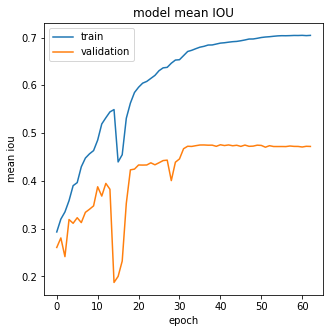

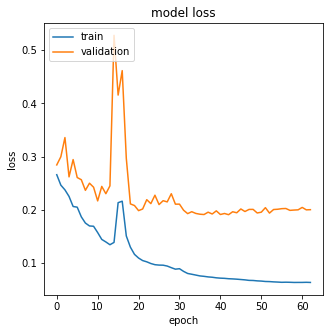

In [77]:
if True:
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                       patience=20)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    
    save_best = tf.keras.callbacks.ModelCheckpoint('best_deeplab.h5', monitor='val_my_mean_iou', save_best_only=True,
                                                    mode='max')  # Saves the best version of the model to disk (as measured on the validation data set)
    
    learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss',patience = 10,verbose = 1,factor = 0.1)
    
    remote_monitor_callback = tf.keras.callbacks.RemoteMonitor(
        root='https://dweet.io', path='/dweet/for/semantic-segmentation-training',
        send_as_json=False, field = 'data'
    )    
    
    tb_callback = tf.keras.callbacks.TensorBoard(log_dir= logdir,histogram_freq = 2, write_graph=True)
    
    history = model.fit(train_datagen ,
            epochs=100,
            validation_data=val_datagen,
            shuffle=True,
             callbacks = [es, save_best, learning_rate_reduction, remote_monitor_callback, tb_callback])

    
    plt.rcParams["figure.figsize"] = (5,5)
    plt.plot(history.history['my_mean_iou'])
    plt.plot(history.history['val_my_mean_iou'])
    plt.title('model mean IOU')
    plt.ylabel('mean iou')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.savefig('miou.jpg')
    plt.show()
    
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.savefig('loss.jpg')
    plt.show()
    model.load_weights('./best_deeplab.h5')

In [78]:
model.evaluate(test_datagen)

40/40 [==============================] - 4s 100ms/step - loss: 0.2026 - my_mean_iou: 0.4707


[0.20256313681602478, 0.4707101881504059]

In [79]:
%tensorboard --port=5032 --logdir logs

Reusing TensorBoard on port 5032 (pid 2318), started 1:16:51 ago. (Use '!kill 2318' to kill it.)

<IPython.core.display.Javascript object>

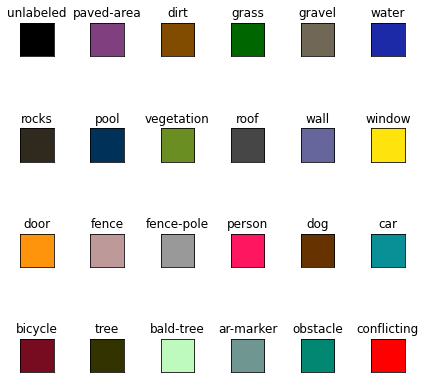

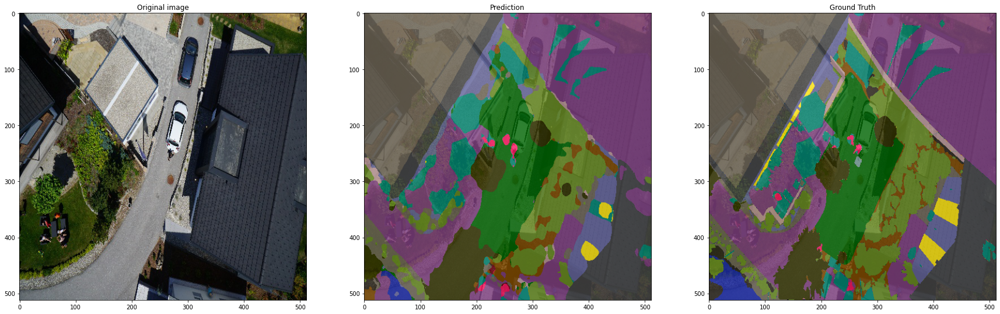

In [85]:
X, y = test_datagen[10]
predictions = model(X).numpy().argmax(axis = 3)
representation = rgb_representations[predictions[0]]
representation_gt = rgb_representations[y.argmax(axis = 3)[0]]
print_legend()
fig, ax = plt.subplots(1, 3, figsize = (30,30))
ax[0].set_title('Original image')
ax[0].imshow(X[1])

ax[1].set_title('Prediction')
ax[1].imshow(X[1])
ax[1].imshow(representation, alpha = 0.8)
ax[2].set_title('Ground Truth')
ax[2].imshow(X[1])
ax[2].imshow(representation_gt, alpha = 0.8)
plt.show()